In [70]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array

In [22]:


td=r"C:\Users\PMLS\Downloads\archive (1)"
val=r"C:\Users\PMLS\Downloads\Covidtest"
train_datagen=ImageDataGenerator(rescale=1./255)

train_generator=train_datagen.flow_from_directory(
    td,target_size=(100,100),
    batch_size=32,
    class_mode="categorical"
)
images, labels=next(train_generator)


Found 1065 images belonging to 1 classes.


In [23]:
images

array([[[[0.5529412 , 0.5529412 , 0.5529412 ],
         [0.5568628 , 0.5568628 , 0.5568628 ],
         [0.5254902 , 0.5254902 , 0.5254902 ],
         ...,
         [0.03137255, 0.03137255, 0.03137255],
         [0.01568628, 0.01568628, 0.01568628],
         [0.00392157, 0.00392157, 0.00392157]],

        [[0.5176471 , 0.5176471 , 0.5176471 ],
         [0.5254902 , 0.5254902 , 0.5254902 ],
         [0.5372549 , 0.5372549 , 0.5372549 ],
         ...,
         [0.00392157, 0.00392157, 0.00392157],
         [0.00392157, 0.00392157, 0.00392157],
         [0.00392157, 0.00392157, 0.00392157]],

        [[0.5294118 , 0.5294118 , 0.5294118 ],
         [0.5058824 , 0.5058824 , 0.5058824 ],
         [0.4901961 , 0.4901961 , 0.4901961 ],
         ...,
         [0.00392157, 0.00392157, 0.00392157],
         [0.00392157, 0.00392157, 0.00392157],
         [0.00392157, 0.00392157, 0.00392157]],

        ...,

        [[0.10196079, 0.10196079, 0.10196079],
         [0.02352941, 0.02352941, 0.02352941]

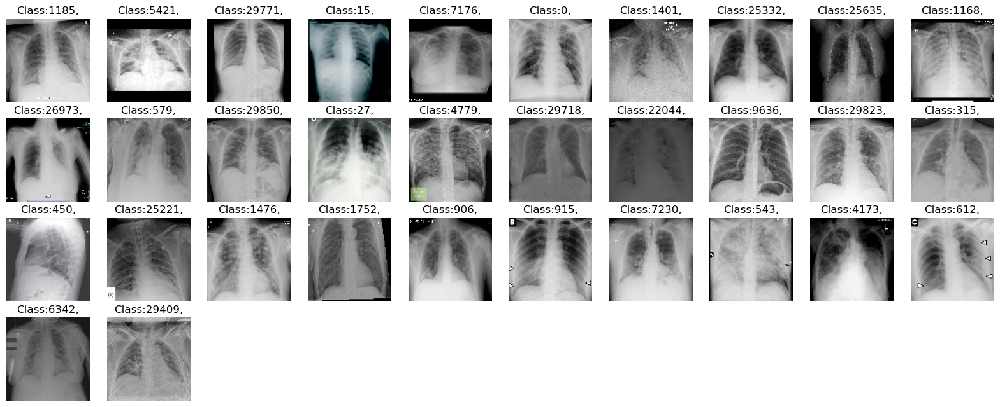

In [24]:
plt.figure(figsize=(20,20))
for i in range(len(images)):
    plt.subplot(10,10,i+1)
    plt.imshow(images[i])
    plt.title(f'Class:{np.argmax(images[i])},')
    plt.axis('off')
plt.show()

In [50]:
batch_size = 800
img_height = 180
img_width = 180

In [51]:
train_ds = tf.keras.utils.image_dataset_from_directory(
  td,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 1065 files belonging to 1 classes.
Using 852 files for training.


In [52]:
val_ds = tf.keras.utils.image_dataset_from_directory(
  val,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 96 files belonging to 1 classes.
Using 19 files for validation.


In [53]:
class_names = train_ds.class_names
print(class_names)

['COVID']


In [69]:
import matplotlib.pyplot as plt

plt.figure(figsize=(200, 200))
for images, labels in train_ds.take(1):
  for i in range(100):
    ax = plt.subplot(20,5, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

In [31]:
for image_batch, labels_batch in train_ds:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(32, 180, 180, 3)
(32,)
